# Ninja Cart Image classification - Arghya Aratder

# Definition of problem

create a multi-class classifier to identify the vegetables in the data set

# EDA

In [1]:
import os
import numpy as np
import tensorflow as tf
tf.keras.utils.set_random_seed(111)
from tensorflow import keras
from tensorflow.keras import layers, regularizers
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.metrics as metrics
%matplotlib inline

In [2]:
!gdown 1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=1dec72c6-0e2a-4b2a-86a5-f7ae600aecbf
To: /content/ninjacart_data.zip
100% 275M/275M [00:05<00:00, 52.6MB/s]


In [3]:
!unzip /content/ninjacart_data.zip

Archive:  /content/ninjacart_data.zip
   creating: ninjacart_data/test/
   creating: ninjacart_data/test/indian market/
  inflating: ninjacart_data/test/indian market/bhl.jpeg  
  inflating: ninjacart_data/test/indian market/bhv.jpeg  
  inflating: ninjacart_data/test/indian market/bn.jpeg  
  inflating: ninjacart_data/test/indian market/hjx.jpeg  
  inflating: ninjacart_data/test/indian market/igis.jpeg  
  inflating: ninjacart_data/test/indian market/in.jpeg  
  inflating: ninjacart_data/test/indian market/india-4898453__340.jpg  
  inflating: ninjacart_data/test/indian market/indianmarket10.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket12.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket13.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket14.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket15.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket18.jpeg  
  inflating: ninjacart_data/test/indian market/

In [4]:
def load_data(base_dir="ninjacart_data"):
    # checking if the data folders are present
    assert os.path.exists(f"{base_dir}/train") and os.path.exists(f"{base_dir}/test")

    print('\nLoading Data...')
    train_data = tf.keras.utils.image_dataset_from_directory(
        f"{base_dir}/train", shuffle=True, label_mode='categorical'
    )

    test_data = tf.keras.utils.image_dataset_from_directory(
        f"{base_dir}/test", shuffle=False, label_mode='categorical'
    )
    return train_data, test_data, train_data.class_names

In [5]:
train_data, test_data, class_names = load_data()


Loading Data...
Found 3135 files belonging to 4 classes.
Found 351 files belonging to 4 classes.


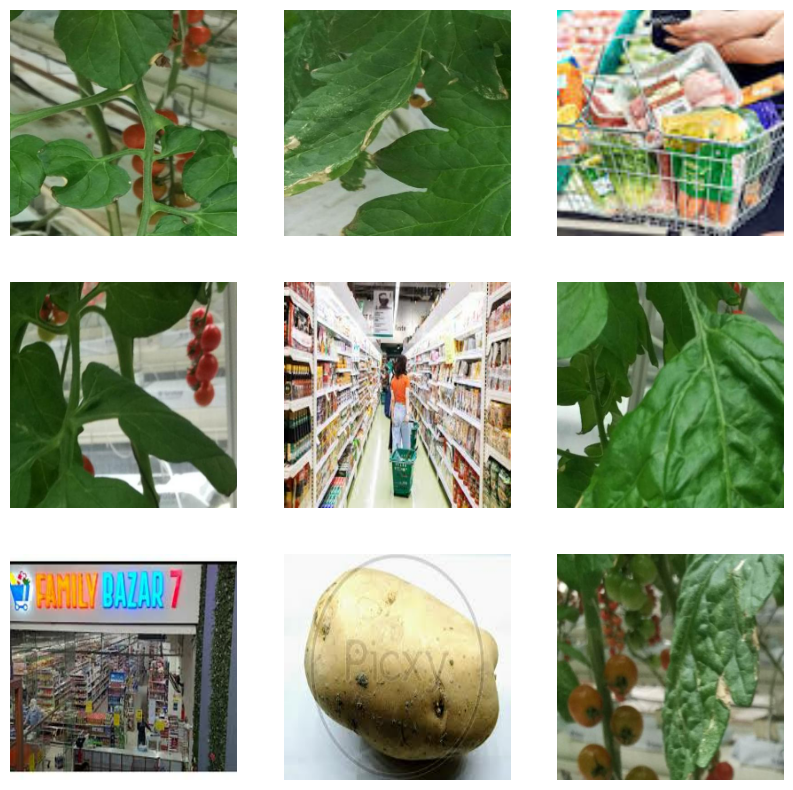

In [8]:
plt.figure(figsize=(10, 10))
for images, labels in train_data.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    #plt.title(class_names[labels[i]])
    plt.axis("off")

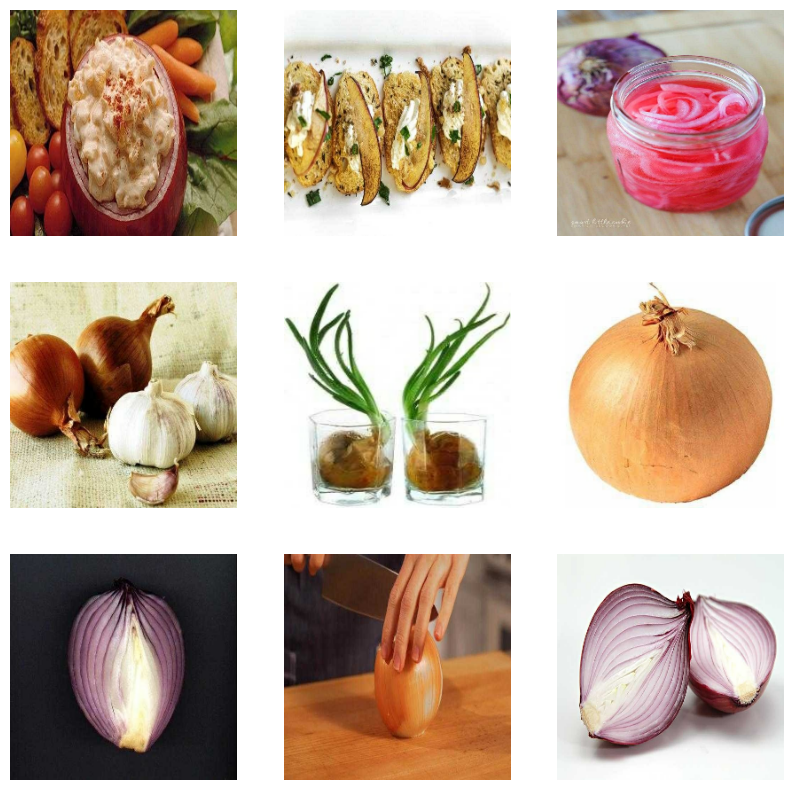

In [18]:
plt.figure(figsize=(10, 10))
for images, labels in test_data.take(5):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    #plt.title(class_names[labels[i]])
    plt.axis("off")

In [11]:
print(train_data.class_names)

['indian market', 'onion', 'potato', 'tomato']


In [19]:
print(test_data.class_names)

['indian market', 'onion', 'potato', 'tomato']


In [12]:
print(train_data.cardinality().numpy())

98


In [20]:
print(test_data.cardinality().numpy())

11


# Data Preprocessing

In [21]:
def preprocess(train_data, test_data, target_height=128, target_width=128):

    # Data Processing Stage with resizing and rescaling operations
    data_preprocess = keras.Sequential(
        name="data_preprocess",
        layers=[
            layers.Resizing(target_height, target_width),
            layers.Rescaling(1.0/255),
        ]
    )

    # Perform Data Processing on the train, val, test dataset
    train_ds = train_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    test_ds = test_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)

    return train_ds, test_ds

In [22]:
train_ds, test_ds = preprocess(train_data, test_data)

# Splitting the dataset into train, validation, and test set

In [24]:
validation_size = int(0.2 * train_ds.cardinality().numpy())
val_ds = train_ds.take(validation_size)
train_ds = train_ds.skip(validation_size)

In [25]:

print("Training Set Size: %d" % train_ds.cardinality().numpy())
print("Validation Set Size: %d" % val_ds.cardinality().numpy())
print("Test Set Size: %d" % test_ds.cardinality().numpy())

Training Set Size: 79
Validation Set Size: 19
Test Set Size: 11


# CNN from scratch

In [26]:
def arch_1(height=128, width=128):
    num_classes = 4
    hidden_size = 256

    model = keras.Sequential(
        name="model_cnn_1",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", activation='relu', input_shape=(height, width, 3)),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=32, kernel_size=3, padding="same", activation='relu'),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=64, kernel_size=3, padding="same", activation='relu'),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=128, kernel_size=3, padding="same", activation='relu'),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=256, kernel_size=3, padding="same", activation='relu'),
            # layers.MaxPooling2D(),
            # layers.Flatten(),
            layers.GlobalAveragePooling2D(),
            layers.Dense(units=hidden_size, activation='relu'),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )
    return model

In [27]:
model = arch_1()
model.summary()

Model: "model_cnn_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 32, 32, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 16, 16, 64)        

In [28]:
def compile_train_v1(model, train_ds, val_ds, epochs=10, ckpt_path="/tmp/checkpoint"):
    model.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    model_fit = model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=[
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', mode='max', save_best_only=True),
    ])
    return model_fit

In [29]:
model_fit = compile_train_v1(model, train_ds, val_ds)

Epoch 1/10
79/79 [==============================] - 70s 816ms/step - loss: 1.0732 - accuracy: 0.4733 - val_loss: 0.8932 - val_accuracy: 0.5510
Epoch 2/10
79/79 [==============================] - 67s 791ms/step - loss: 0.8071 - accuracy: 0.6118 - val_loss: 0.6962 - val_accuracy: 0.6974
Epoch 3/10
79/79 [==============================] - 68s 822ms/step - loss: 0.5666 - accuracy: 0.7653 - val_loss: 0.5498 - val_accuracy: 0.7961
Epoch 4/10
79/79 [==============================] - 71s 858ms/step - loss: 0.4840 - accuracy: 0.8101 - val_loss: 0.5367 - val_accuracy: 0.7862
Epoch 5/10
79/79 [==============================] - 71s 861ms/step - loss: 0.4385 - accuracy: 0.8279 - val_loss: 0.5044 - val_accuracy: 0.7878
Epoch 6/10
79/79 [==============================] - 71s 858ms/step - loss: 0.4056 - accuracy: 0.8421 - val_loss: 0.4591 - val_accuracy: 0.8076
Epoch 7/10
79/79 [==============================] - 68s 821ms/step - loss: 0.3740 - accuracy: 0.8453 - val_loss: 0.4023 - val_accuracy: 0.8454

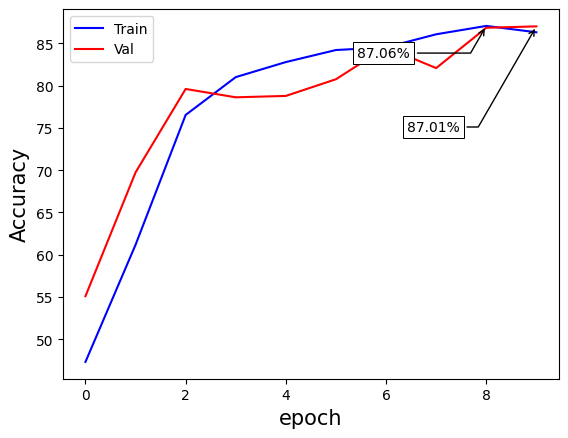

In [32]:
def annot_max(x,y, xytext=(0.94,0.96), ax=None, only_y=True):
    xmax = x[np.argmax(y)]
    ymax = max(y)
    if only_y:
        text = "{:.2f}%".format(ymax)
    else:
        text= "x={:.2f}, y={:.2f}%".format(xmax, ymax)
    if not ax:
        ax=plt.gca()
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    arrowprops=dict(arrowstyle="->",connectionstyle="angle,angleA=0,angleB=60")
    kw = dict(xycoords='data',textcoords="axes fraction",
              arrowprops=arrowprops, bbox=bbox_props, ha="right", va="top")
    ax.annotate(text, xy=(xmax, ymax), xytext=xytext, **kw)



def plot_accuracy(model_fit):
    #accuracy graph
    x = range(0,len(model_fit.history['accuracy']))
    y_train = [acc * 100 for acc in model_fit.history['accuracy']]
    y_val = [acc * 100 for acc in model_fit.history['val_accuracy']]

    plt.plot(x, y_train, label='Train', color='b')
    annot_max(x, y_train, xytext=(0.7,0.9))
    plt.plot(x, y_val, label='Val', color='r')
    annot_max(x, y_val, xytext=(0.8,0.7))
    plt.ylabel('Accuracy', fontsize=15)
    plt.xlabel('epoch', fontsize=15)
    plt.legend()
    plt.show()


plot_accuracy(model_fit)

In [33]:
def print_accuracy_stats(model, ds, class_names):
    model.load_weights("/tmp/checkpoint")
    true_onehot = tf.concat([y for x, y in ds], axis=0)
    true_categories = tf.argmax(true_onehot, axis=1)
    y_pred = model.predict(ds)
    predicted_categories = tf.argmax(y_pred, axis=1)

    test_acc = metrics.accuracy_score(true_categories, predicted_categories) * 100
    print(f'\nTest Accuracy: {test_acc:.2f}%\n')

# Note: This doesn't work with shuffled datasets
def plot_confusion_matrix(model, ds, class_names):
    model.load_weights("/tmp/checkpoint")
    true_onehot = tf.concat([y for x, y in ds], axis=0)
    true_categories = tf.argmax(true_onehot, axis=1)
    y_pred = model.predict(ds)
    predicted_categories = tf.argmax(y_pred, axis=1)
    cm = metrics.confusion_matrix(true_categories,predicted_categories) # last batch
    sns.heatmap(cm, annot=True, xticklabels=class_names, yticklabels=class_names, cmap="YlGnBu", fmt='g')
    plt.show()

11/11 [==============================] - 5s 483ms/step

Test Accuracy: 85.47%

11/11 [==============================] - 4s 370ms/step


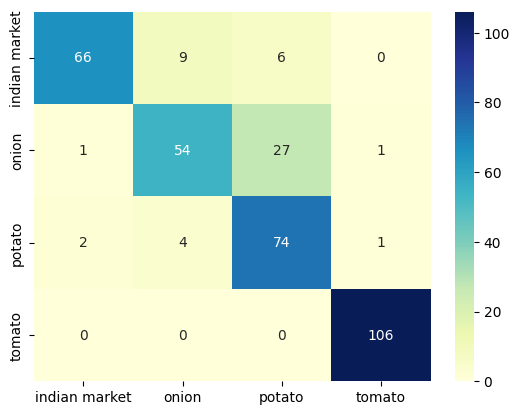

In [34]:
print_accuracy_stats(model, test_ds, class_names)
plot_confusion_matrix(model, test_ds, class_names)

# Pretrained model

In [38]:
tensorboard_callback = keras.callbacks.TensorBoard(log_dir="./logs")

pretrained_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=[128,128, 3])
# "Get the first few blocks of pretrained model and freeze them"
#1. break this pretrained model into two halves. first half is what you will freeze, 2nd half you will keep as it is
#2. sequential api (1st half, 2nd half, flatten, dense)
pretrained_model.trainable=False
vgg16_model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4, activation='softmax')
])

vgg16_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 8192)              0         
                                                                 
 dense_3 (Dense)             (None, 4)                 32772     
                                                                 
Total params: 14747460 (56.26 MB)
Trainable params: 32772 (128.02 KB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


In [41]:
vgg16_model.compile(
    optimizer='adam',
    loss = 'categorical_crossentropy',
    metrics=['accuracy']
)

In [43]:
history = vgg16_model.fit(train_ds, epochs=3,
                    validation_data=val_ds, callbacks=[tensorboard_callback])

Epoch 1/3
79/79 [==============================] - 581s 7s/step - loss: 0.3424 - accuracy: 0.8674 - val_loss: 0.2832 - val_accuracy: 0.8816
Epoch 2/3
79/79 [==============================] - 573s 7s/step - loss: 0.2067 - accuracy: 0.9276 - val_loss: 0.2281 - val_accuracy: 0.9178
Epoch 3/3
79/79 [==============================] - 610s 8s/step - loss: 0.1427 - accuracy: 0.9632 - val_loss: 0.2198 - val_accuracy: 0.9211


In [44]:
%load_ext tensorboard

# Results Interpretation & Stakeholder Presentation

In [45]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

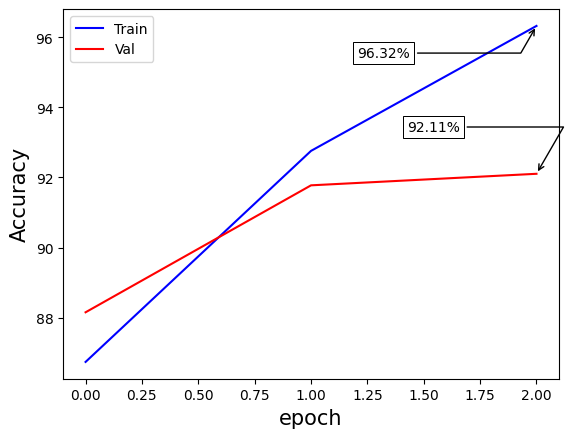

In [47]:
plot_accuracy(history)